# Streaming KMeans Distance Analysis
This notebook demonstrates how to use the `Streaming_Kmeans` function to cluster vectors and analyze the distribution of pairwise distances using histograms.

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append('../yoav')  # Adjust path as needed to import Streaming_Kmeans
from Kmeans import Streaming_Kmeans

In [58]:
# Set the path to your data file and parameters
filepath = '../inputoutput/data/your_data.txt'  # Update this to your actual data file

# You may need to set config.params.split_char and other params before calling Streaming_Kmeans
import config
config.params


{'split_char': ' ',
 'normalize_vecs': True,
 'batch_size': 1000,
 'init_size': 1000,
 'max_centroids': 1000}

In [59]:
config.params = {
    'split_char': ' ',
    'normalize_vecs': True,
    'batch_size': 1000,
    'init_size': 1000,
    'max_centroids': 1000
}

#filepath='../data/mnist.csv'  # Update this to your actual data file
filepath='../data/shuffled_output.txt'  # Update this to your actual data file
# Run Streaming_Kmeans and get D (distance matrix)
skmeans, D = Streaming_Kmeans(filepath)

Read 1000 vectors
Estimated Z (max pairwise distance, FAISS) = 1.6452
minimum distance in buffer = 0.0003
Read 2000 vectors
Estimated Z (max pairwise distance, FAISS) = 1.6452
minimum distance in buffer = 0.0003
Read 400000 vectors

## Plot Histograms of Pairwise Distances
We will plot the histogram of all pairwise distances and overlay the histograms of the 1st, 2nd, 3rd, and 10th nearest neighbor distances.

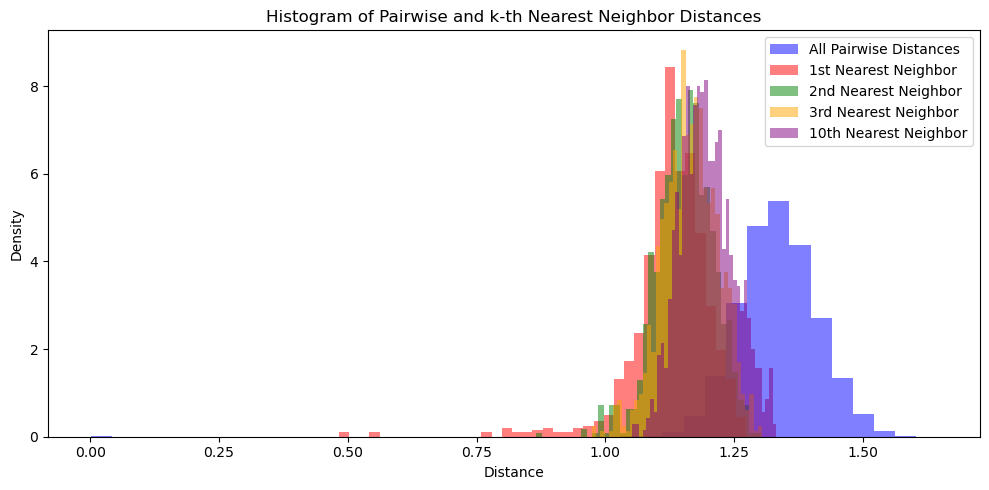

In [60]:
# Prepare distance data
D_flat = D[D > 0].flatten()
D_no_diag = D.copy()
np.fill_diagonal(D_no_diag, np.inf)
nn1_distances = np.sqrt(np.partition(D_no_diag, 1, axis=1)[:, 1])  # 1st nearest neighbor
nn2_distances = np.sqrt(np.partition(D_no_diag, 2, axis=1)[:, 2])  # 2nd nearest neighbor
nn3_distances = np.sqrt(np.partition(D_no_diag, 3, axis=1)[:, 3])  # 3rd nearest neighbor
nn10_distances = np.sqrt(np.partition(D_no_diag, 10, axis=1)[:, 10])  # 10th nearest neighbor

plt.figure(figsize=(10, 5))
plt.hist(np.sqrt(D_flat), bins=40, color='blue', alpha=0.5, label='All Pairwise Distances', density=True)
plt.hist(nn1_distances, bins=40, color='red', alpha=0.5, label='1st Nearest Neighbor', density=True)
plt.hist(nn2_distances, bins=40, color='green', alpha=0.5, label='2nd Nearest Neighbor', density=True)
plt.hist(nn3_distances, bins=40, color='orange', alpha=0.5, label='3rd Nearest Neighbor', density=True)
plt.hist(nn10_distances, bins=40, color='purple', alpha=0.5, label='10th Nearest Neighbor', density=True)
plt.title('Histogram of Pairwise and k-th Nearest Neighbor Distances')
plt.xlabel('Distance')
plt.ylabel('Density')
plt.legend()
plt.tight_layout()
plt.show()

You can adjust the file path and parameters as needed for your dataset. The above plot provides insight into the distribution of distances in your data and the clustering structure found by Streaming KMeans.

In [61]:
skmeans.get_centroids()

array([[ 0.12638296,  0.01813322,  0.03998251, ...,  0.03927394,
        -0.0724368 ,  0.08920326],
       [ 0.02703101,  0.01968704, -0.01897361, ..., -0.01391973,
        -0.02884671, -0.07303562],
       [ 0.00858824,  0.01580708,  0.05420094, ...,  0.02638608,
         0.15254295,  0.02849925],
       ...,
       [-0.00483039, -0.00305048, -0.0730517 , ..., -0.0672715 ,
        -0.05943255,  0.04941355],
       [ 0.13851824,  0.00725195,  0.01271163, ...,  0.05303542,
         0.09610075,  0.01148153],
       [ 0.08161786, -0.07302792, -0.06107573, ...,  0.12213504,
         0.01951391,  0.02296272]], dtype=float32)

In [62]:
#<VSCode.Cell language="python">
# Stream vectors and labels, assign each vector to its nearest centroid, and compute conditional entropy of labels given centroid

import sys
sys.path.append('../yoav')
from Kmeans import Reader
import numpy as np
import faiss
from collections import defaultdict, Counter
from scipy.stats import entropy

# Set your data file path and batch size

batch_size = 1000

# Load centroids from the fitted model (assume skmeans is already available)
centroids = skmeans.get_centroids()

# Build FAISS index for centroids
index = faiss.IndexFlatL2(centroids.shape[1])
index.add(centroids.astype(np.float32))

# Stream data and assign each vector to its nearest centroid
reader = Reader(filepath)
centroid_to_labels = defaultdict(list)

for vectors, labels in reader.stream_batches(batch_size):
    # Find nearest centroid for each vector in the batch
    D, I = index.search(vectors.astype(np.float32), 1)
    for label, centroid_idx in zip(labels, I[:, 0]):
        centroid_to_labels[centroid_idx].append(label)
reader.close()

# Compute conditional entropy H(Label | Centroid)
all_labels = np.concatenate(list(centroid_to_labels.values()))
unique_labels = np.unique(all_labels)
label_to_idx = {label: idx for idx, label in enumerate(unique_labels)}

total_vectors = len(all_labels)
conditional_entropy = 0.0

for centroid_idx, labels in centroid_to_labels.items():
    label_counts = np.zeros(len(unique_labels))
    for label in labels:
        label_counts[label_to_idx[label]] += 1
    if label_counts.sum() == 0:
        continue
    p = label_counts / label_counts.sum()
    h = entropy(p, base=2)
    weight = label_counts.sum() / total_vectors
    conditional_entropy += weight * h

print(f"Conditional entropy H(Label | Centroid): {conditional_entropy:.4f} bits")

# Optionally, show the label distribution for each centroid
for centroid_idx, labels in centroid_to_labels.items():
    label_counts = Counter(labels)
    print(f"Centroid {centroid_idx}: {dict(label_counts)}")


Read 1000 vectors

Read 400000 vectorsConditional entropy H(Label | Centroid): 9.3671 bits
Centroid 944: {'jabber': 1, 'comboni': 1, 'jahjah': 1, 'bedjaoui': 1, 'radicalisation': 1, 'feiz': 1, 'benarbia': 1, 'nurseryman': 1, 'waymouth': 1, 'ranko': 1, 'budiono': 1, 'farts': 1, 'khalifeh': 1, 'opbf': 1, 'yokel': 1, '7-kim': 1, "ba'asyir": 1, 'solotrek': 1, 'irwandi': 1, 'steeplejack': 1, 'phumzile': 1, 'arichat': 1, 'jailor': 1, 'berends': 1, 'sarfati': 1, 'sayeeda': 1, 'rahmeh': 1, 'fás': 1, 'breiz': 1, 'assif': 1, 'sabich': 1, 'mamdouh': 1, 'northerner': 1, 'dannielynn': 1, 'kesavan': 1, 'franzén': 1, 'karahan': 1, 'pridiyathorn': 1, 'hady': 1, 'yafei': 1, 'shahadat': 1, 'scliar': 1, 'tinh': 1, 'tonalism': 1, 'hippy': 1, 'monjurul': 1, 'beanpole': 1, 'alamieyeseigha': 1, 'huckster': 1, 'zerkin': 1, 'mlambo': 1, 'gholam': 1, 'pamatong': 1, 'midwesterner': 1, 'skala': 1, 'subhi': 1, 'litigators': 1, 'muktar': 1, 'all-knowing': 1, 'malefactor': 1, 'shotmaker': 1, 'strokeplayer': 1, 'coffa': 1, 'delaema': 1

In [63]:
# Assign the majority label to each centroid based on its associated examples

from collections import Counter

centroid_majority_label = {}

for centroid_idx, labels in centroid_to_labels.items():
    if labels:
        label_counts = Counter(labels)
        majority_label = label_counts.most_common(1)[0][0]
        centroid_majority_label[centroid_idx] = majority_label
    else:
        centroid_majority_label[centroid_idx] = None  # No examples assigned

# Print the majority label for each centroid
for centroid_idx in sorted(centroid_majority_label):
    print(f"Centroid {centroid_idx}: Majority label = {centroid_majority_label[centroid_idx]}")


Centroid 0: Majority label = 18:50
Centroid 1: Majority label = codacons
Centroid 2: Majority label = then-world
Centroid 3: Majority label = norihiko
Centroid 4: Majority label = chinmaya
Centroid 5: Majority label = sacconaghi
Centroid 6: Majority label = intracerebral
Centroid 7: Majority label = meurice
Centroid 8: Majority label = trondhjem
Centroid 9: Majority label = enggang
Centroid 10: Majority label = guin
Centroid 11: Majority label = elseneer
Centroid 12: Majority label = quackenbush
Centroid 13: Majority label = mcdougals
Centroid 14: Majority label = 72.5
Centroid 15: Majority label = appiah
Centroid 16: Majority label = hertrich
Centroid 17: Majority label = m.i.t.
Centroid 18: Majority label = phenomenon
Centroid 19: Majority label = heppenstall
Centroid 20: Majority label = massillon
Centroid 21: Majority label = threesome
Centroid 22: Majority label = spikes
Centroid 23: Majority label = non-mandatory
Centroid 24: Majority label = workingmen
Centroid 25: Majority labe

In [68]:
# Create an undirected graph with 1000 nodes (one for each centroid), edges to k=10 nearest neighbors

import networkx as nx
import numpy as np
import faiss

# Number of centroids/nodes and nearest neighbors
num_nodes = config.params['max_centroids']
k = 5

# Get centroids and their majority labels
centroids = skmeans.get_centroids()
centroids = centroids[:num_nodes]  # Ensure only 1000 centroids/nodes
# centroid_majority_label should already be defined from previous cell

# Build FAISS index for centroids
index = faiss.IndexFlatL2(centroids.shape[1])
index.add(centroids.astype(np.float32))

# Find k+1 nearest neighbors for each centroid (including itself)
D, I = index.search(centroids.astype(np.float32), k + 1)

# Create the undirected graph
G = nx.Graph()

# Add nodes with majority label as attribute
for idx in range(num_nodes):
    label = centroid_majority_label.get(idx, None)
    G.add_node(idx, label=label)

# Add undirected edges to k nearest neighbors (excluding self)
for idx in range(num_nodes):
    neighbors = I[idx, 1:]  # skip the first neighbor (itself)
    for neighbor in neighbors:
        if not G.has_edge(idx, neighbor):
            G.add_edge(idx, neighbor)


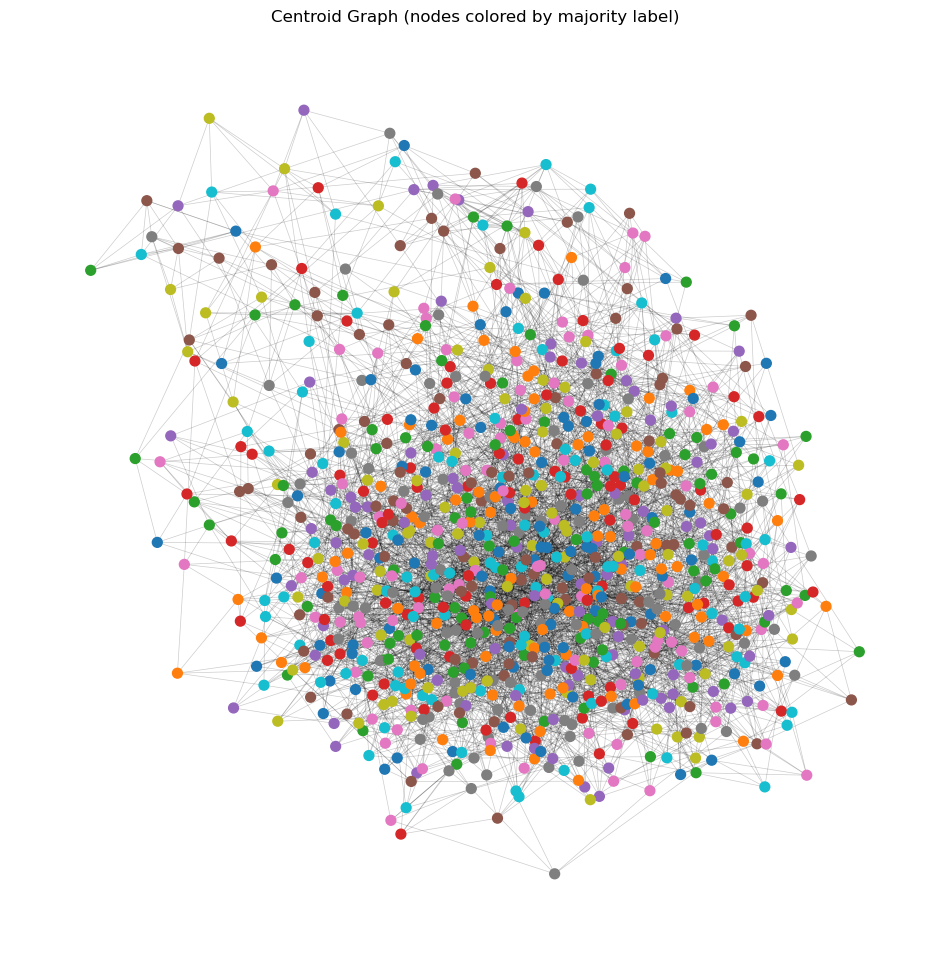

In [69]:
# Visualize the centroid graph G using networkx and matplotlib

import matplotlib.pyplot as plt
import networkx as nx

plt.figure(figsize=(12, 12))

# Use spring layout for visualization (can be slow for large graphs)
pos = nx.spring_layout(G, seed=42, k=0.15)

# Get node colors by majority label (convert to integers for coloring)
labels = nx.get_node_attributes(G, 'label')
unique_labels = list(set(labels.values()))
label_to_color = {label: idx for idx, label in enumerate(unique_labels)}
node_colors = [label_to_color[labels[n]] if labels[n] is not None else -1 for n in G.nodes()]

# Draw nodes and edges
nodes = nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.tab10, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.2, width=0.5)

plt.title("Centroid Graph (nodes colored by majority label)")
plt.axis('off')

# Add a legend for the node colors (majority labels)
from matplotlib.lines import Line2D
legend_elements = []
for label, color_idx in label_to_color.items():
    legend_elements.append(Line2D([0], [0], marker='o', color='w',
                                  label=str(label),
                                  markerfacecolor=plt.cm.tab10(color_idx % 10), markersize=10))
#plt.legend(handles=legend_elements, title="Majority Label", loc='lower left', fontsize=10, title_fontsize=12, frameon=True)

plt.show()


/var/folders/cl/mbdp3zfx4cg9mmnz60g052540000gn/T/ipykernel_52641/4272163967.py:42: UserWarning: Legend does not support handles for ScalarMappable instances.
A proxy artist may be used instead.
See: https://matplotlib.org/stable/users/explain/axes/legend_guide.html#controlling-the-legend-entries
  plt.legend([sm], [f'Node color: #nodes within distance ≤ {distance}'], loc='lower left', fontsize=12, frameon=True)


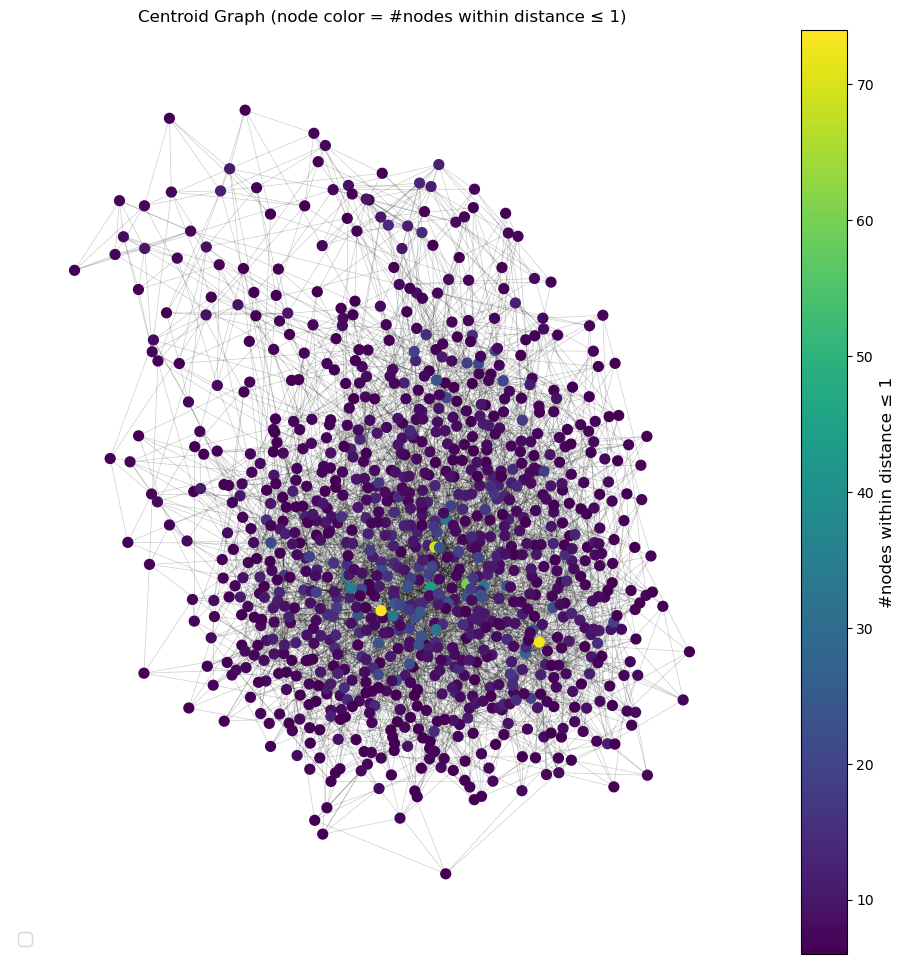

In [73]:
# Visualize the centroid graph G with node color corresponding to the actual number of nodes within distance at most `distance`
# (Fix colorbar error by using the mappable returned by draw_networkx_nodes)

import matplotlib.pyplot as plt
import networkx as nx

plt.figure(figsize=(12, 12))

# Use the same layout as before for consistency
# (If you want to use the previous layout, make sure 'pos' is still defined in the notebook)
# Otherwise, recompute:
# pos = nx.spring_layout(G, seed=42, k=0.15)

distance = 1 # Set the distance cutoff here

# Compute the number of nodes within distance at most `distance` for each node
node_reach = {}
for node in G.nodes():
    # Get all nodes within distance <= `distance` (including itself)
    lengths = nx.single_source_shortest_path_length(G, node, cutoff=distance)
    node_reach[node] = len(lengths)

reach_values = np.array(list(node_reach.values()))

# Draw nodes and edges
nodes = nx.draw_networkx_nodes(G, pos, node_color=reach_values, cmap=plt.cm.viridis, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.2, width=0.5)

plt.title(f"Centroid Graph (node color = #nodes within distance ≤ {distance})")
plt.axis('off')
cbar = plt.colorbar(nodes, label=f'#nodes within distance ≤ {distance}')
cbar.ax.tick_params(labelsize=10)
cbar.set_label(f'#nodes within distance ≤ {distance}', fontsize=12)

# Add a legend for node color scale
from matplotlib.lines import Line2D
import matplotlib as mpl

# Create a colorbar legend for the node color scale
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=reach_values.min(), vmax=reach_values.max()))
sm.set_array([])
plt.legend([sm], [f'Node color: #nodes within distance ≤ {distance}'], loc='lower left', fontsize=12, frameon=True)

plt.show()


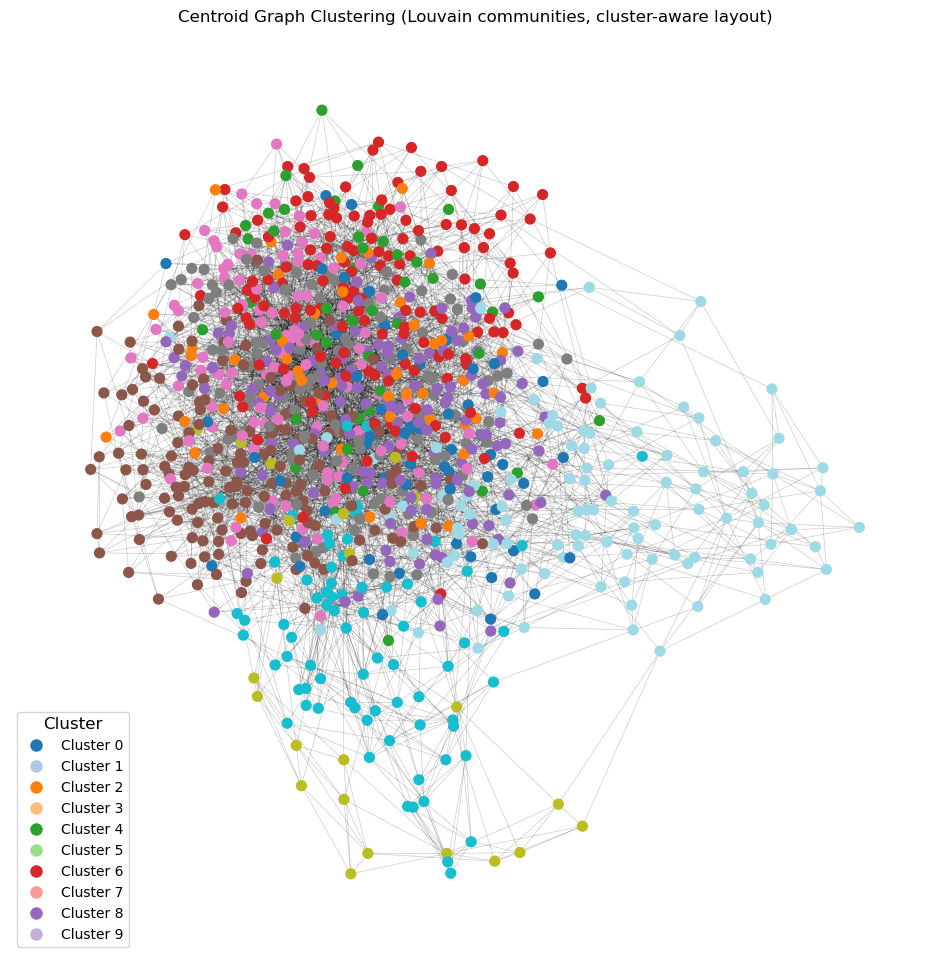

In [75]:

# Display a clustering of the centroid graph G using the Louvain community detection algorithm
# and adjust the layout so that nodes in the same cluster are closer together

import matplotlib.pyplot as plt
import networkx as nx

# You may need to install the community-louvain package if not already installed:
# !pip install python-louvain

try:
    import community as community_louvain
except ImportError:
    import sys
    !{sys.executable} -m pip install python-louvain
    import community as community_louvain

# Compute the best partition (clustering) using Louvain method
partition = community_louvain.best_partition(G)

# Assign a color to each cluster
clusters = list(set(partition.values()))
cluster_to_color = {cluster: idx for idx, cluster in enumerate(clusters)}
node_colors = [cluster_to_color[partition[n]] for n in G.nodes()]

# Adjust layout: use spring_layout with cluster-based initial positions
# Place each cluster's nodes around a different point in space
import numpy as np

# Compute cluster centers on a circle
n_clusters = len(clusters)
angle_step = 2 * np.pi / n_clusters
cluster_centers = {
    cluster: (np.cos(i * angle_step), np.sin(i * angle_step))
    for i, cluster in enumerate(clusters)
}

# Assign initial positions for each node based on its cluster
init_pos = {}
for node in G.nodes():
    cluster = partition[node]
    # Add small random noise to spread nodes within cluster
    noise = 0.1 * np.random.randn(2)
    init_pos[node] = np.array(cluster_centers[cluster]) + noise

# Use spring layout with these initial positions
pos = nx.spring_layout(G, seed=42, k=0.15, pos=init_pos, iterations=100)

plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.tab20, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.2, width=0.5)

plt.title("Centroid Graph Clustering (Louvain communities, cluster-aware layout)")
plt.axis('off')

# Add a legend for clusters (show up to 10 clusters)
from matplotlib.lines import Line2D
legend_elements = []
for cluster, color_idx in list(cluster_to_color.items())[:10]:
    legend_elements.append(Line2D([0], [0], marker='o', color='w',
                                  label=f'Cluster {cluster}',
                                  markerfacecolor=plt.cm.tab20(color_idx % 20), markersize=10))
if len(legend_elements) > 0:
    plt.legend(handles=legend_elements, title="Cluster", loc='lower left', fontsize=10, title_fontsize=12, frameon=True)

plt.show()
